In [ ]:
! pip install kaggle


In [ ]:
! mkdir ~/.kaggle

In [ ]:
! cp kaggle.json ~/.kaggle/

In [ ]:
! chmod 600 ~/.kaggle/kaggle.json

In [ ]:
! kaggle competitions download Deepfake-Detection-Challenge

100% 4.12G/4.13G [00:40<00:00, 117MB/s]
100% 4.13G/4.13G [00:40<00:00, 111MB/s]


In [ ]:
from tensorflow import keras

import matplotlib.pyplot as plt
import tensorflow as tf
import pandas as pd
import numpy as np
import imageio
import cv2
import os

In [ ]:
! pip install patool

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 77.5/77.5 kB 1.9 MB/s eta 0:00:00


In [ ]:
import patoolib

In [ ]:
patoolib.extract_archive('/content/Deepfake-Detection-Challenge.zip')

patool: Extracting /content/Deepfake-Detection-Challenge.zip ...
patool: running /usr/bin/7z x -o./Unpack_50a5fn2i -- /content/Deepfake-Detection-Challenge.zip
patool: ... /content/Deepfake-Detection-Challenge.zip extracted to `Deepfake-Detection-Challenge' (multiple files in root).


'Deepfake-Detection-Challenge'

In [11]:
TRAIN_SAMPLE_FOLDER = '/content/Deepfake-Detection-Challenge/train_sample_videos'
TEST_FOLDER = '/content/Deepfake-Detection-Challenge/test_videos'

print(f"train samples: {len(os.listdir(os.path.join(DATA_FOLDER, TRAIN_SAMPLE_FOLDER)))}")
print(f"test samples: {len(os.listdir(os.path.join(DATA_FOLDER, TEST_FOLDER)))}")

train samples: 401
test samples: 400


In [12]:
train_sample_metadata = pd.read_json('/content/Deepfake-Detection-Challenge/train_sample_videos/metadata.json').T
train_sample_metadata.head()

,label,split,original
aagfhgtpmv.mp4,FAKE,train,vudstovrck.mp4
aapnvogymq.mp4,FAKE,train,jdubbvfswz.mp4
abarnvbtwb.mp4,REAL,train,None
abofeumbvv.mp4,FAKE,train,atvmxvwyns.mp4
abqwwspghj.mp4,FAKE,train,qzimuostzz.mp4


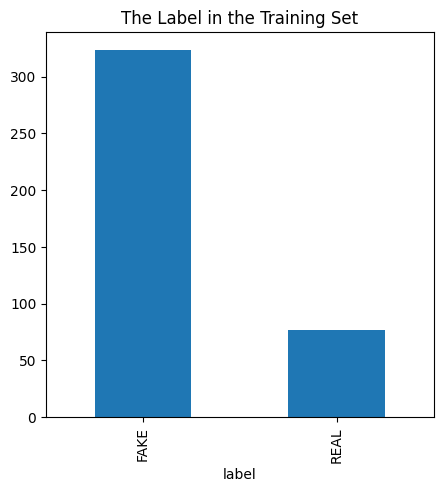

In [13]:
train_sample_metadata.groupby('label')['label'].count().plot(figsize=(5,5),kind='bar',title='The Label in the Training Set')
plt.show()

In [14]:
train_sample_metadata.shape

(400, 3)

In [15]:
f_train_sample_video = list(train_sample_metadata.loc[train_sample_metadata.label=='FAKE'].sample(5).index)
f_train_sample_video

['eeyhxisdfh.mp4',
 'adohikbdaz.mp4',
 'diomeixhrg.mp4',
 'emgjphonqb.mp4',
 'aelzhcnwgf.mp4']

In [16]:
def capture_image_from_video(video_path):
    capture_image = cv2.VideoCapture(video_path)
    ret, frame = capture_image.read()
    fig = plt.figure(figsize =(10,10))
    ax = fig.add_subplot(111)
    frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    ax.imshow(frame)

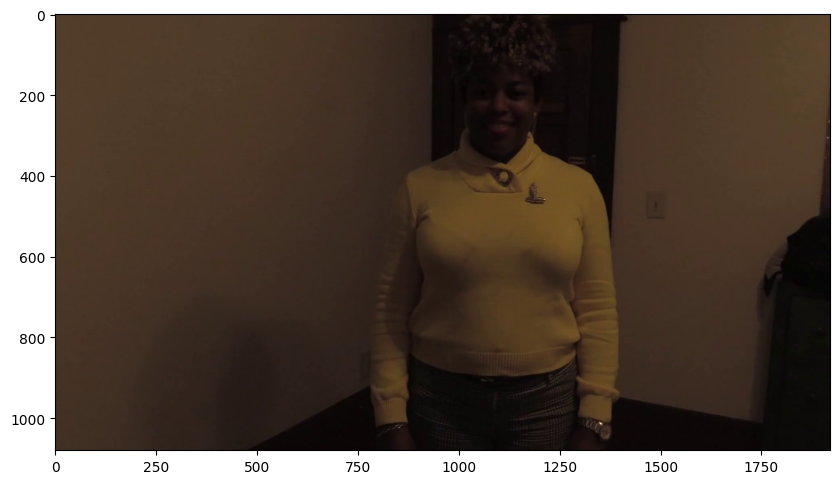

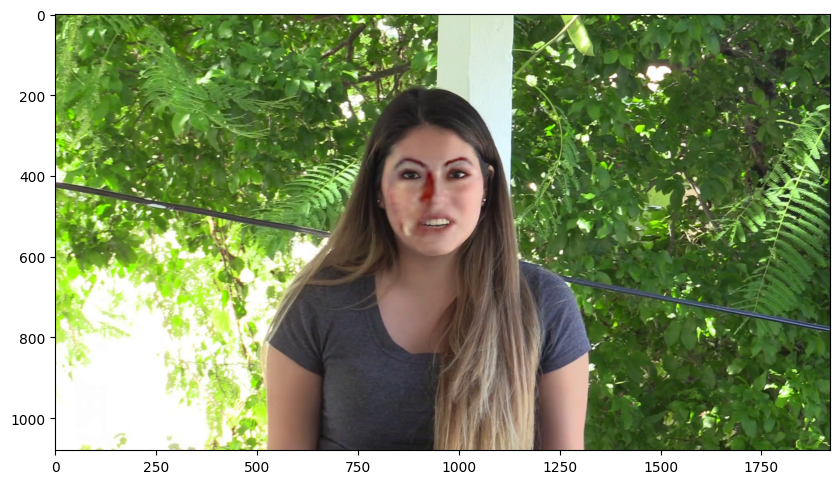

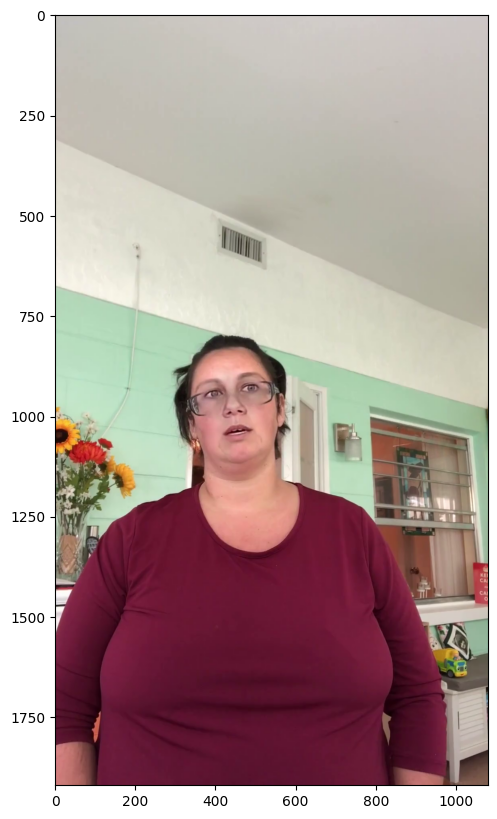

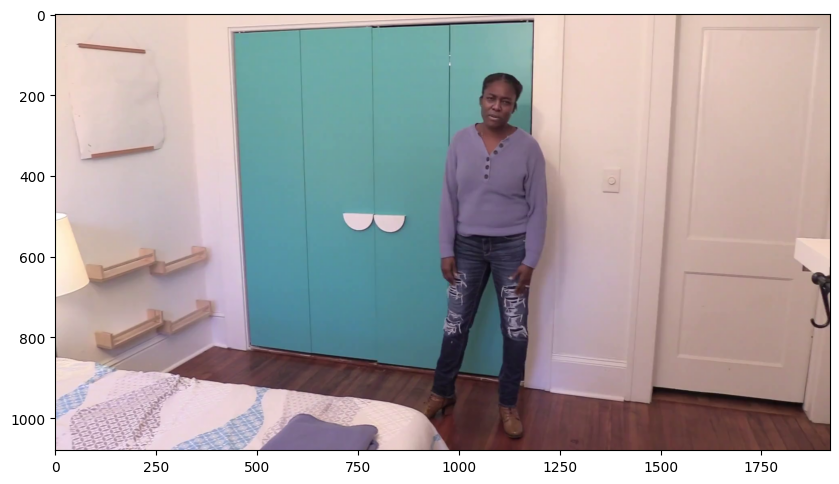

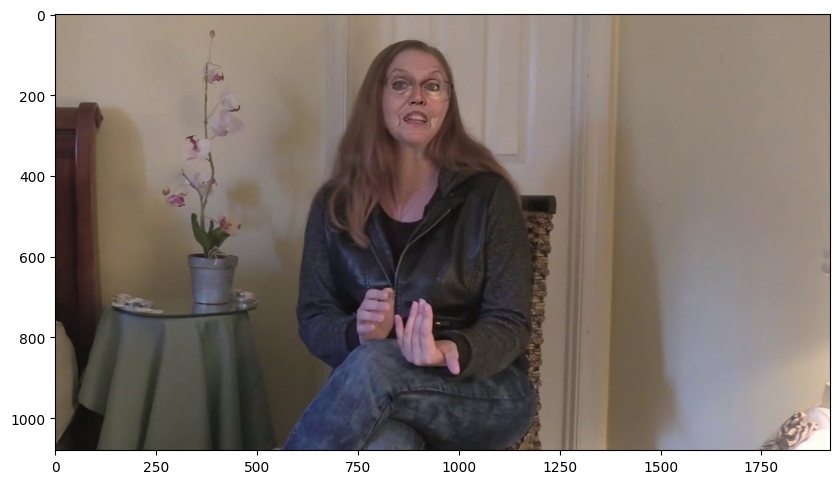

In [17]:
for video_file in f_train_sample_video:
    capture_image_from_video(os.path.join(DATA_FOLDER, TRAIN_SAMPLE_FOLDER, video_file))

In [18]:
r_train_sample_video = list(train_sample_metadata.loc[train_sample_metadata.label=='REAL'].sample(5).index)
r_train_sample_video

['bgwmmujlmc.mp4',
 'cprhtltsjp.mp4',
 'bulkxhhknf.mp4',
 'dsjbknkujw.mp4',
 'cmbzllswnl.mp4']

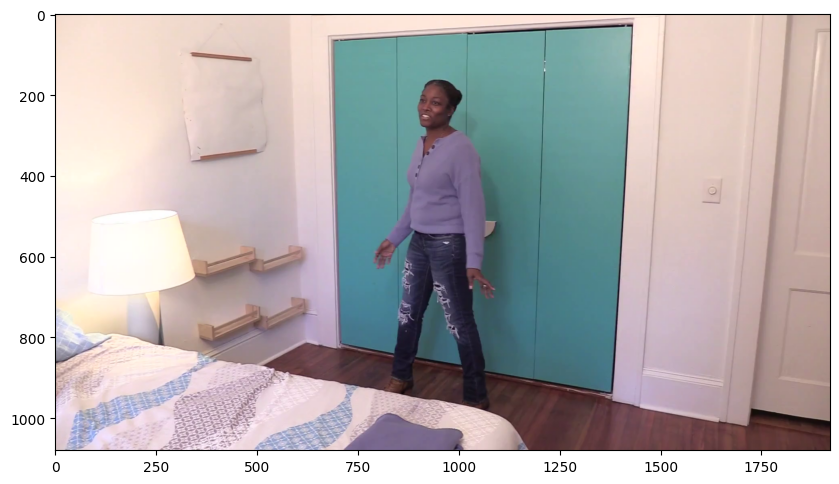

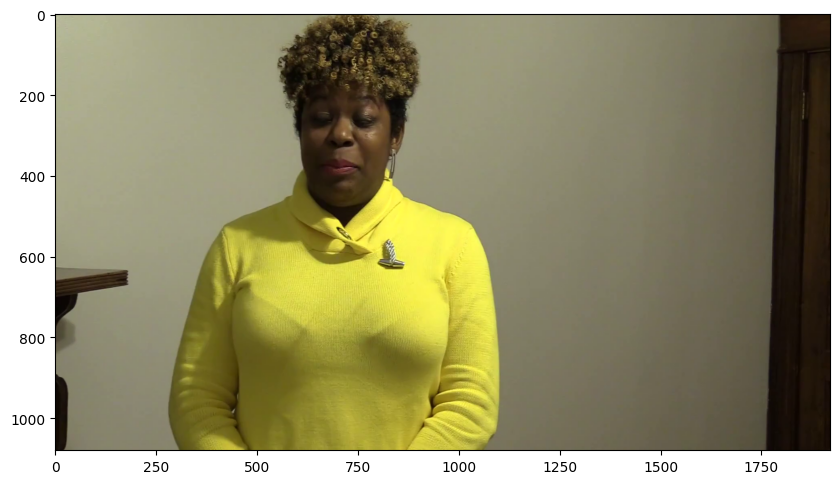

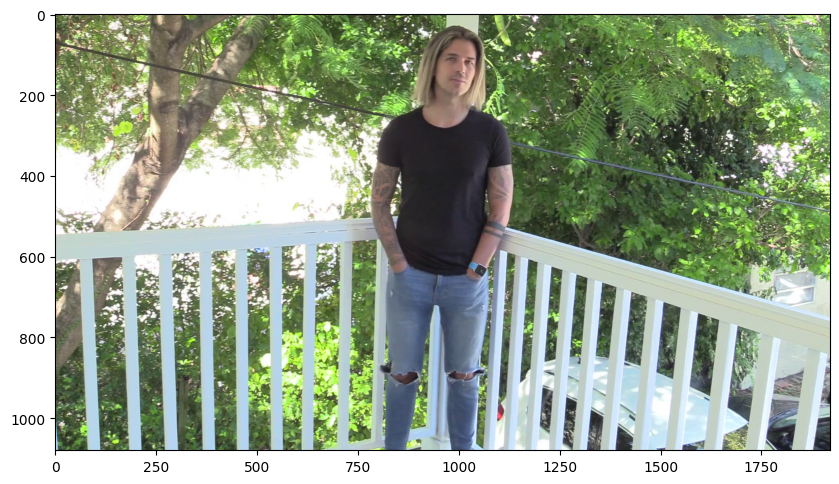

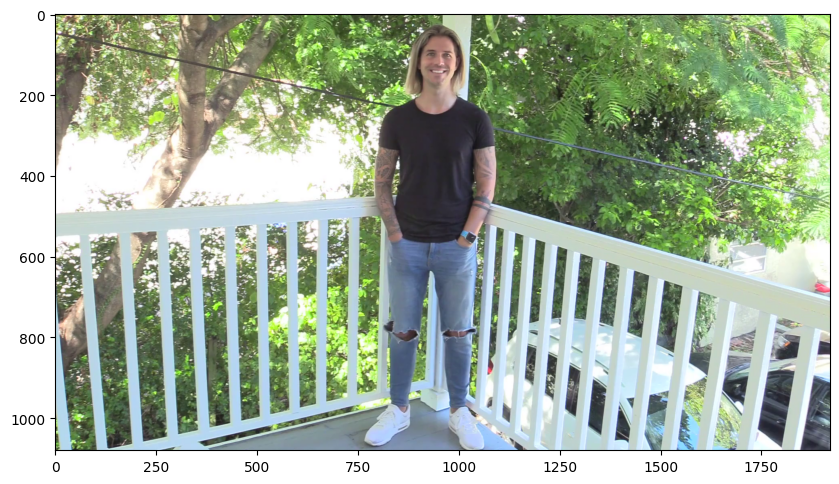

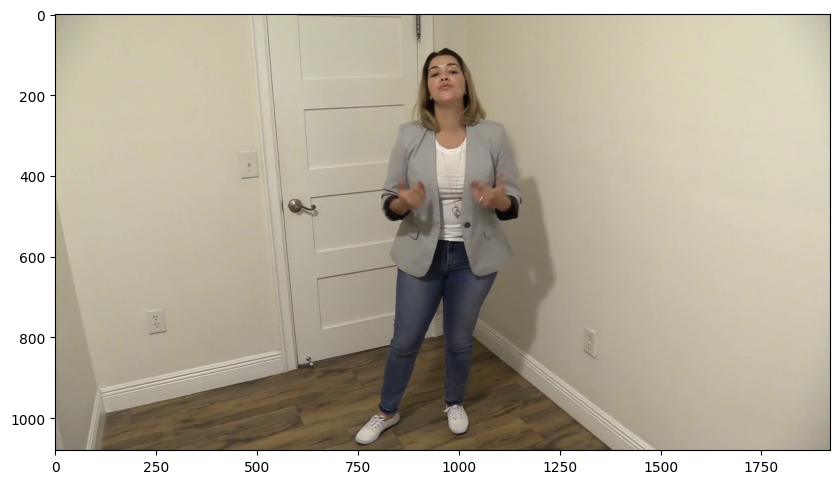

In [19]:
for video_file in r_train_sample_video:
    capture_image_from_video(os.path.join(DATA_FOLDER,TRAIN_SAMPLE_FOLDER,video_file))

In [20]:
f_videos = list(train_sample_metadata.loc[train_sample_metadata.label=='FAKE'].index)

In [21]:
from IPython.display import HTML
from base64 import b64encode

def play_video(video_file,subset=TRAIN_SAMPLE_FOLDER):
    video_url = open(os.path.join(DATA_FOLDER,subset,video_file),'rb').read()
    data_url = "data:video/mp4;base64," + b64encode(video_url).decode()
    return HTML("""<video width=500 controls><source src="%s" type="video/mp4"></video>""" %data_url)
play_video(f_videos[5])

In [22]:
img_size = 224
batch_size = 64
epochs = 15

max_seq_length = 20
num_features = 2048

In [23]:
def crop_center_square(frame):
    y,x = frame.shape[0:2]
    min_dim = min(y, x)
    start_x = (x // 2) - (min_dim // 2)
    start_y = (y // 2) - (min_dim // 2)
    return frame[start_y :start_y + min_dim, start_x : start_x + min_dim]

def load_video(path, max_frames=0, resize=(img_size, img_size)):
    cap = cv2.VideoCapture(path)
    frames = []
    try:
        while 1:
            ret, frame = cap.read()
            if not ret:
                break
            frame = crop_center_square(frame)
            frame = cv2.resize(frame, resize)
            frame = frame[:, :, [2, 1, 0]]
            frames.append(frame)

            if len(frames) == max_frames:
                break
    finally:
        cap.release()
    return np.array(frames)


In [24]:
def pretrain_feature_extractor():
    feature_extractor = keras.applications.InceptionV3(
    weights = "imagenet",
    include_top=False,
    pooling="avg",
    input_shape = (img_size,img_size,3)
    )
    preprocess_input = keras.applications.inception_v3.preprocess_input

    inputs = keras.Input((img_size,img_size,3))
    preprocessed = preprocess_input(inputs)

    outputs = feature_extractor(preprocessed)
    return keras.Model(inputs, outputs, name="feature_extractor")

feature_extractor = pretrain_feature_extractor()

87910968/87910968 [==============================] - 1s 0us/step


In [25]:
def prepare_all_videos(df, root_dir): #df是train_sample_metadata->json的split
    num_samples = len(df)
    video_paths = list(df.index)
    labels = df["label"].values
    labels = np.array(labels=='FAKE').astype(np.int)

    frame_masks = np.zeros(shape=(num_samples, max_seq_length), dtype="bool") #array=360*20
    frame_features = np.zeros(
        shape=(num_samples, max_seq_length, num_features), dtype="float32" #array=360*20*2048
    )

    for idx, path in enumerate(video_paths):
        frames = load_video(os.path.join(root_dir, path))
        frames = frames[None, ...]

        temp_frame_mask = np.zeros(shape=(1, max_seq_length,), dtype="bool")
        temp_frame_features = np.zeros(shape=(1, max_seq_length, num_features), dtype="float32")

        for i, batch in enumerate(frames):
            video_length = batch.shape[0]
            length = min(max_seq_length, video_length) #if length is over 20s ,only cut 20s
            for j in range(length):
                temp_frame_features[i, j, :] =feature_extractor.predict(batch[None, j, :])
            temp_frame_mask[i, :length] =1 # 1 = not masked, 0 = masked ->give 1 when there are images ,otherwise 0 for padding

        frame_features[idx,] =temp_frame_features.squeeze() #squeeze array for training
        frame_masks[idx,] =temp_frame_mask.squeeze()

    return (frame_features, frame_masks), labels

In [26]:
from sklearn.model_selection import train_test_split

Train_set , Test_set = train_test_split(train_sample_metadata, test_size=0.1,random_state=42,
                                       stratify=train_sample_metadata['label'])
print(Train_set.shape, Test_set.shape)

(360, 3) (40, 3)


In [27]:
train_data, train_labels = prepare_all_videos(Train_set, "train")
test_data, test_labels = prepare_all_videos(Test_set, "test")

print(f"Frame features in train set:{train_data[0].shape}")
print(f"Frame masks in train set:{train_data[1].shape}")

Frame features in train set:(360, 20, 2048)
Frame masks in train set:(360, 20)


<ipython-input-25-85f8f73484ae>:5: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  labels = np.array(labels=='FAKE').astype(np.int)


In [28]:
frame_features_input = keras.Input((max_seq_length, num_features))
mask_input = keras.Input((max_seq_length,),dtype="bool")

x = keras.layers.GRU(16, return_sequences=True)(frame_features_input, mask = mask_input)
x = keras.layers.GRU(8)(x)
x = keras.layers.Dropout(0.4)(x)
x = keras.layers.Dense(8, activation="relu")(x)
output = keras.layers.Dense(1, activation="sigmoid")(x)

model = keras.Model([frame_features_input, mask_input], output)
model.compile(loss="binary_crossentropy", optimizer="adam", metrics=["accuracy"])
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_3 (InputLayer)        [(None, 20, 2048)]           0         []                            
                                                                                                  
 input_4 (InputLayer)        [(None, 20)]                 0         []                            
                                                                                                  
 gru (GRU)                   (None, 20, 16)               99168     ['input_3[0][0]',             
                                                                     'input_4[0][0]']             
                                                                                                  
 gru_1 (GRU)                 (None, 8)                    624       ['gru[0][0]']             

In [29]:
checkpoint = keras.callbacks.ModelCheckpoint('./', save_weights_only=True, save_best_only=True)
history = model.fit(
        [train_data[0], train_data[1]],
        train_labels,
        validation_data=([test_data[0], test_data[1]], test_labels),
        callbacks=[checkpoint],
        epochs=epochs,
        batch_size=8
)

Epoch 1/15
45/45 [==============================] - 10s 79ms/step - loss: 0.6870 - accuracy: 0.7972 - val_loss: 0.6806 - val_accuracy: 0.8000
Epoch 2/15
45/45 [==============================] - 2s 36ms/step - loss: 0.6747 - accuracy: 0.8083 - val_loss: 0.6696 - val_accuracy: 0.8000
Epoch 3/15
45/45 [==============================] - 1s 27ms/step - loss: 0.6635 - accuracy: 0.8083 - val_loss: 0.6586 - val_accuracy: 0.8000
Epoch 4/15
45/45 [==============================] - 1s 23ms/step - loss: 0.6526 - accuracy: 0.8083 - val_loss: 0.6486 - val_accuracy: 0.8000
Epoch 5/15
45/45 [==============================] - 1s 23ms/step - loss: 0.6424 - accuracy: 0.8083 - val_loss: 0.6390 - val_accuracy: 0.8000
Epoch 6/15
45/45 [==============================] - 1s 23ms/step - loss: 0.6328 - accuracy: 0.8083 - val_loss: 0.6298 - val_accuracy: 0.8000
Epoch 7/15
45/45 [==============================] - 1s 22ms/step - loss: 0.6236 - accuracy: 0.8083 - val_loss: 0.6218 - val_accuracy: 0.8000
Epoch 8/15
4

In [30]:
test_videos = pd.DataFrame(list(os.listdir(os.path.join(DATA_FOLDER, TEST_FOLDER))), columns=['video'])

In [31]:
def prepare_single_video(frames):
    frames = frames[None, ...]
    frame_mask = np.zeros(shape=(1, max_seq_length,), dtype="bool")
    frame_features = np.zeros(shape=(1, max_seq_length, num_features), dtype="float32")

    for i, batch in enumerate(frames):
        video_length = batch.shape[0]
        length = min(max_seq_length, video_length)
        for j in range(length):
            frame_features[i, j, :] = feature_extractor.predict(batch[None, j, :])
        frame_mask[i, :length] = 1  # 1 = not masked, 0 = masked

    return frame_features, frame_mask

def sequence_prediction(path):
    frames = load_video(os.path.join(DATA_FOLDER, TEST_FOLDER,path))
    frame_features, frame_mask = prepare_single_video(frames)
    return model.predict([frame_features, frame_mask])[0]

# This utility is for visualization.
# Referenced from:
# https://www.tensorflow.org/hub/tutorials/action_recognition_with_tf_hub
def to_gif(images):
    converted_images = images.astype(np.uint8)
    imageio.mimsave("animation.gif", converted_images, fps=10)
    return embed.embed_file("animation.gif")


test_video = np.random.choice(test_videos["video"].values.tolist())
print(f"Test video path: {test_video}")

if(sequence_prediction(test_video)>=0.5):
    print(f'The predicted class of the video is FAKE')
else:
    print(f'The predicted class of the video is REAL')

play_video(test_video,TEST_FOLDER)

Test video path: mszblrdprw.mp4
1/1 [==============================] - 3s 3s/step
The predicted class of the video is FAKE
